In [1]:
from IPython.display import display, Image

In [2]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle     

In [3]:
path = r"G:\My Drive\Overlijdensdata Suriname"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
certificates = []
onePage = []

# creates a ScandirIterator aliased as files
for folder in os.listdir(path):
  if "one_page" in folder:
    with os.scandir(os.path.join(path,folder)) as files:
    # loops through each file in the directories
      for file in files:
          if file.name.endswith('.JPG') or file.name.endswith('.jpg'):
            # adds only the image files to the flowers list
              onePage.append(file.name)
  else:
    with os.scandir(os.path.join(path,folder)) as files:
    # loops through each file in the directories
        for file in files:
            if file.name.endswith('.JPG') or file.name.endswith('.jpg'):
              # adds only the image files to the certificates list
                certificates.append(file.name)

In [4]:
print(onePage[:10])
print(len(onePage))

['NL-HaNA_2.10.61_1185_0000.jpg', 'NL-HaNA_2.10.61_1237_0000.jpg', 'NL-HaNA_2.10.61_1237_0001.jpg', 'NL-HaNA_2.10.61_1237_0002.jpg', 'NL-HaNA_2.10.61_1237_0013.jpg', 'NL-HaNA_2.10.61_1237_0014.jpg', 'NL-HaNA_2.10.61_1237_0112.jpg', 'NL-HaNA_2.10.61_1237_0131.jpg', 'NL-HaNA_2.10.61_1237_0113.jpg', 'NL-HaNA_2.10.61_1237_0132.jpg']
232


In [5]:
print(certificates[:10])
print(len(certificates))

['NL-HaNA_2.10.61_1237_0003.jpg', 'NL-HaNA_2.10.61_1237_0004.jpg', 'NL-HaNA_2.10.61_1237_0005.jpg', 'NL-HaNA_2.10.61_1237_0006.jpg', 'NL-HaNA_2.10.61_1237_0007.jpg', 'NL-HaNA_2.10.61_1237_0008.jpg', 'NL-HaNA_2.10.61_1237_0009.jpg', 'NL-HaNA_2.10.61_1237_0015.jpg', 'NL-HaNA_2.10.61_1237_0016.jpg', 'NL-HaNA_2.10.61_1237_0017.jpg']
15011


## Move one page scans to other folder

In [ ]:
# Loop through each image in the dataset
for cert in certificates:
    # check the size of the image 
    try:
        print(cert)
        im = Image.open(os.path.join(cert.split('_')[2],cert))
        w, h = im.size
        im.close()
        # if h/w > 1: portrait
        if h/w > 1:
            os.rename(os.path.join(cert.split('_')[2],cert), os.path.join('onePage', cert))
    except:
        print('error:', cert)

## DBscan clustering

In [ ]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    print(file)
    img = load_img(os.path.join(file.split('_')[2],file), target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features
   
data = {}  

In [ ]:
# Loop through each image in the dataset
for cert in certificates[8000:10000]:
    # extract the features and update the dictionary
    feat = extract_features(cert,model)
    data[cert] = feat  

In [69]:
#with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[8000-10000].pkl",'wb') as f:
#    pickle.dump(data,f)

In [5]:
data = {}

with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[0-2000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[2000-4000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[4000-6000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[6000-8000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[8000-10000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[10000-12000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[12000-14000].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))
with open(r"C:\Users\LHoek\Documents\Repositories\HANDS-RX\data\suriname_features[14000-15011].pkl",'rb') as f:
    d = pickle.load(f)
data.update(d)
print(len(data))

2000
4000
6000
8000
10000
12000
14000
15011


In [6]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)

In [7]:
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components=50, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [8]:
print(f"Components before PCA: {feat.shape[1]}")
print(f"Components after PCA: {pca.n_components}")

Components before PCA: 4096
Components after PCA: 50


In [9]:
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components=2, random_state=22)
pca.fit(feat)
x_reduced = pca.transform(feat)

In [10]:
import numpy as np
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.preprocessing  import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(x)
x_norm = scaler.transform(x)

# set to desired values: eps around 0.5 and min_samples around 5
# our setting: 0.6 and 3
db = DBSCAN(eps=0.6, min_samples=3).fit(x_norm)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 17
Estimated number of noise points: 1546


In [12]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,labels):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [14]:
for i in range(len(groups)-1):
    print(len(groups[i]))
print(len(groups[-1]))

13369
24
3
3
3
3
9
9
3
3
4
3
3
14
4
5
3
1546


In [15]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 1000:
        print(f"Clipping cluster size from {len(files)} to 99")
        files = files[:99]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(os.path.join(file.split('_')[2],file))
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

In [16]:
for i in range(-1, len(groups)-1):
    print(i)
    for im in groups[i]:
        if "NL-HaNA_2.10.61_1185_0140.jpg" in im:
            print(im)
        if "NL-HaNA_2.10.61_1185_0141.jpg" in im:
            print(im)
        if "NL-HaNA_2.10.61_1185_0162.jpg" in im:
            print(im)

-1
NL-HaNA_2.10.61_1185_0162.jpg
0
NL-HaNA_2.10.61_1185_0140.jpg
NL-HaNA_2.10.61_1185_0141.jpg
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16


Clipping cluster size from 13369 to 30


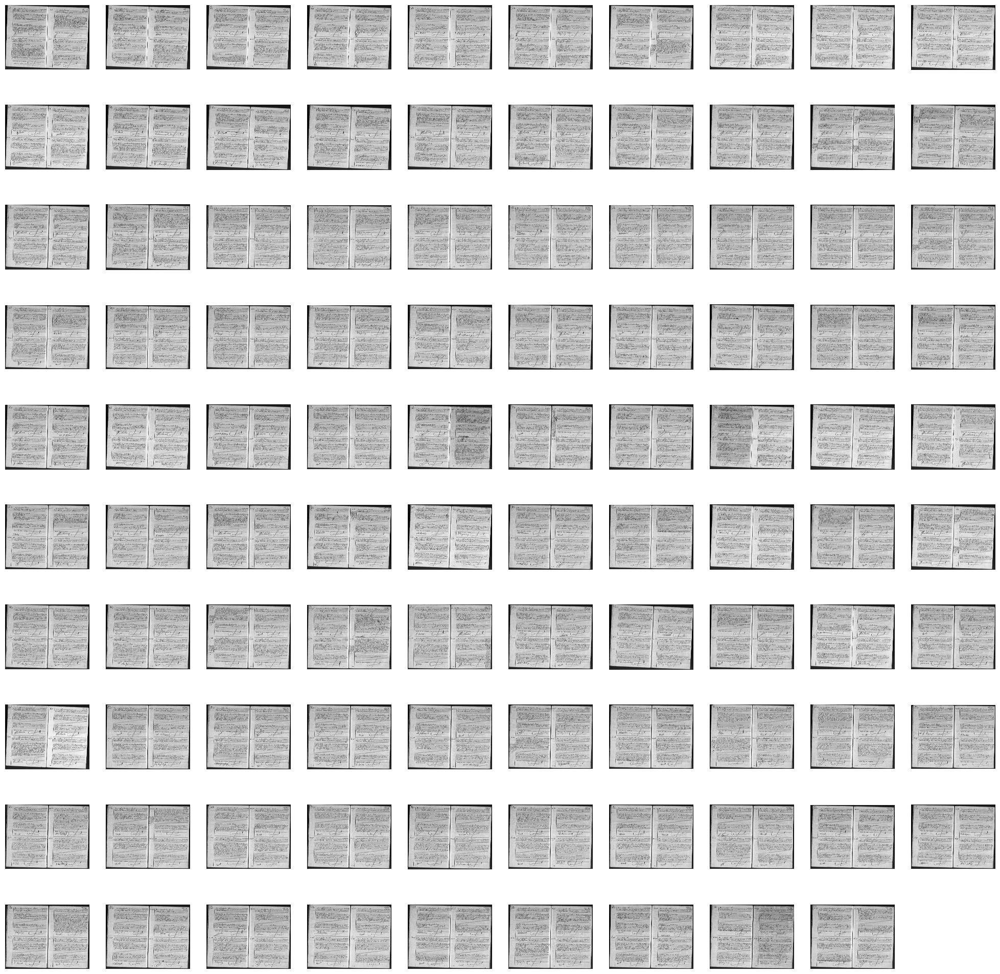

In [22]:
view_cluster(0)

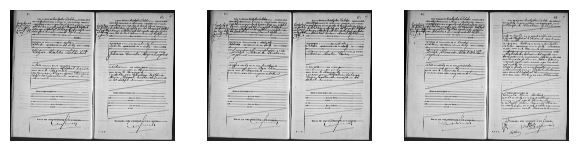

In [26]:
view_cluster(2)

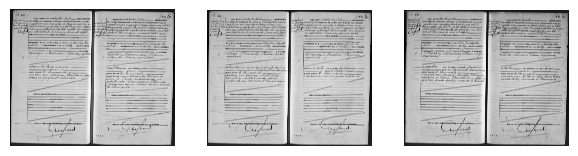

In [27]:
view_cluster(3)

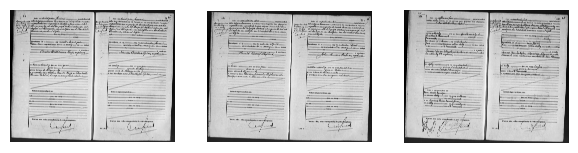

In [28]:
view_cluster(4)

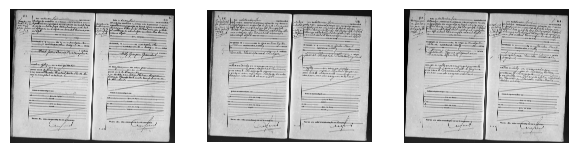

In [24]:
view_cluster(5)

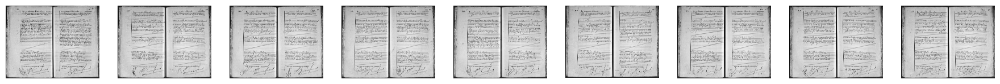

In [29]:
view_cluster(6)

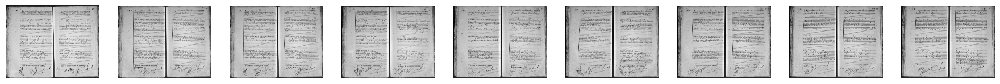

In [30]:
view_cluster(7)

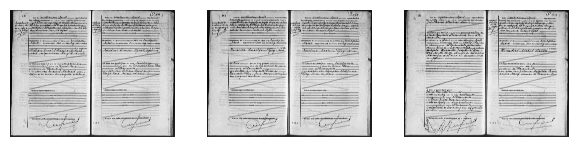

In [31]:
view_cluster(8)

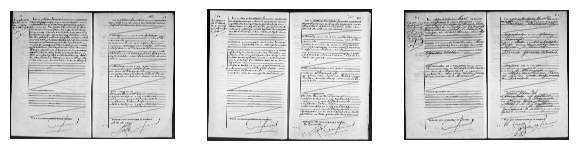

In [32]:
view_cluster(9)

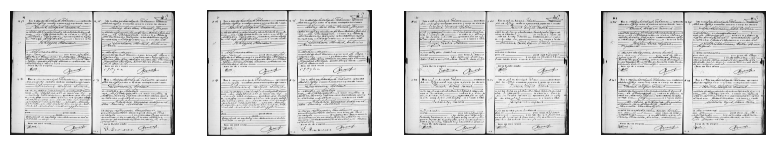

In [33]:
view_cluster(10)

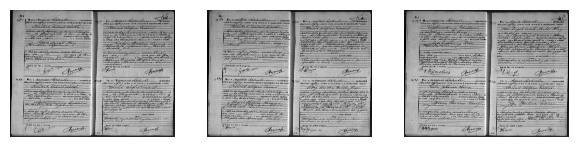

In [34]:
view_cluster(11)

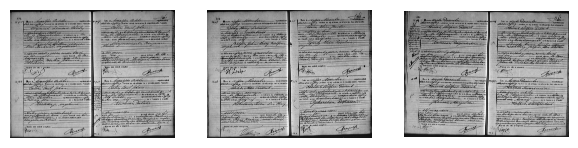

In [35]:
view_cluster(12)

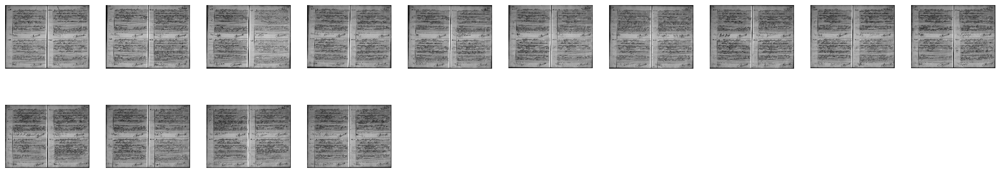

In [36]:
view_cluster(13)

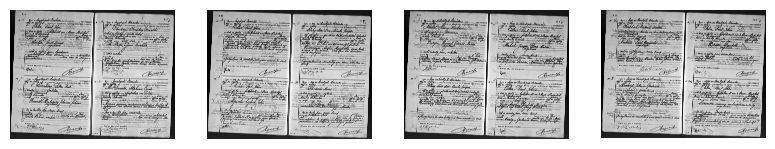

In [37]:
view_cluster(14)

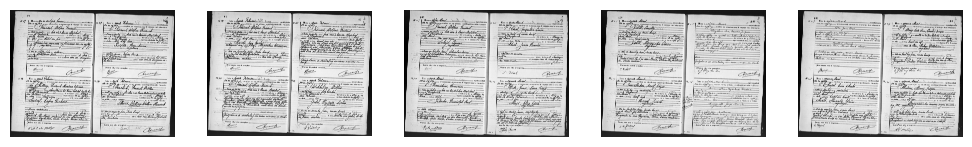

In [38]:
view_cluster(15)

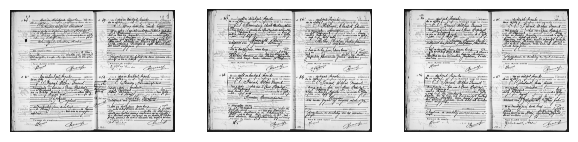

In [39]:
view_cluster(16)

Clipping cluster size from 1546 to 30


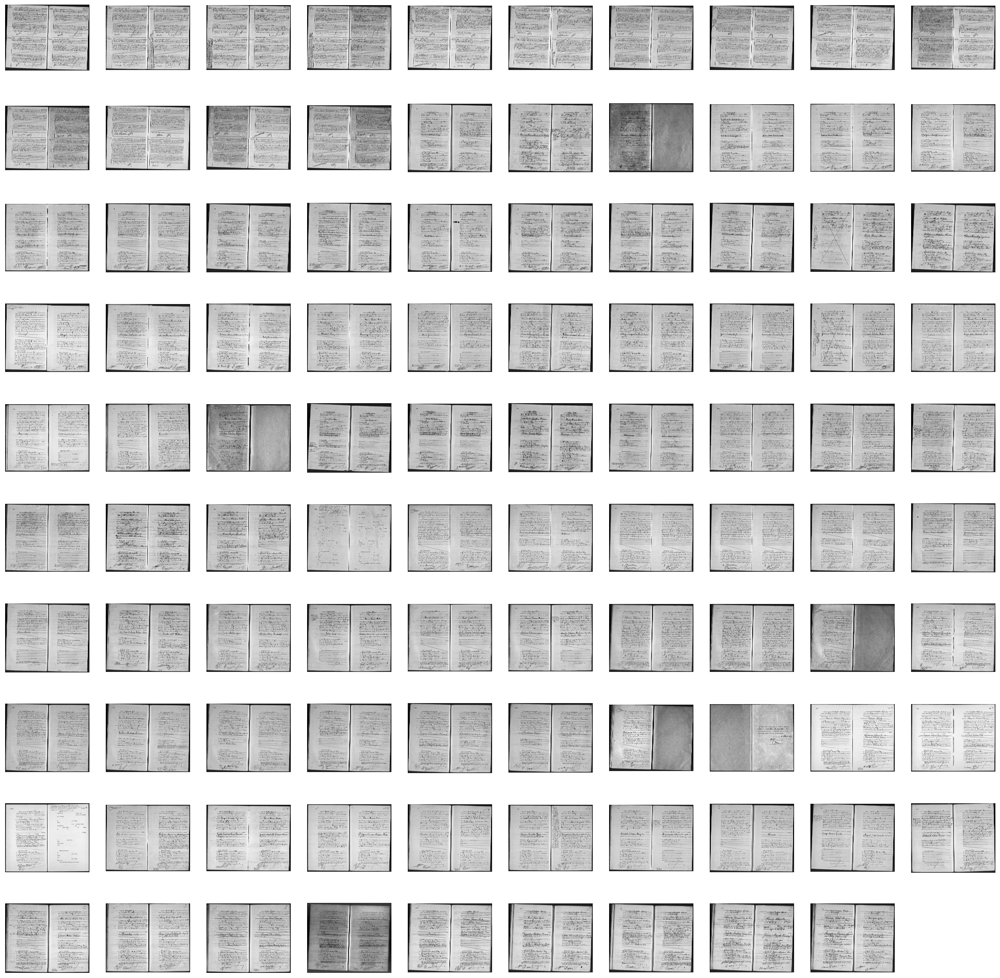

In [40]:
view_cluster(-1)

In [18]:
print(groups[-1])

['NL-HaNA_2.10.61_1237_0048.jpg', 'NL-HaNA_2.10.61_1237_0085.jpg', 'NL-HaNA_2.10.61_1237_0033.jpg', 'NL-HaNA_2.10.61_1237_0123.jpg', 'NL-HaNA_2.10.61_1237_0175.jpg', 'NL-HaNA_2.10.61_1237_0174.jpg', 'NL-HaNA_2.10.61_1237_0191.jpg', 'NL-HaNA_2.10.61_1237_0190.jpg', 'NL-HaNA_2.10.61_1237_0172.jpg', 'NL-HaNA_2.10.61_1237_0200.jpg', 'NL-HaNA_2.10.61_1237_0203.jpg', 'NL-HaNA_2.10.61_1237_0210.jpg', 'NL-HaNA_2.10.61_1237_0204.jpg', 'NL-HaNA_2.10.61_1237_0194.jpg', 'NL-HaNA_2.10.61_1185_0034.jpg', 'NL-HaNA_2.10.61_1185_0171.jpg', 'NL-HaNA_2.10.61_1185_0215.jpg', 'NL-HaNA_2.10.61_1185_0003.jpg', 'NL-HaNA_2.10.61_1185_0009.jpg', 'NL-HaNA_2.10.61_1185_0001.jpg', 'NL-HaNA_2.10.61_1185_0008.jpg', 'NL-HaNA_2.10.61_1185_0021.jpg', 'NL-HaNA_2.10.61_1185_0030.jpg', 'NL-HaNA_2.10.61_1185_0052.jpg', 'NL-HaNA_2.10.61_1185_0074.jpg', 'NL-HaNA_2.10.61_1185_0102.jpg', 'NL-HaNA_2.10.61_1185_0106.jpg', 'NL-HaNA_2.10.61_1185_0128.jpg', 'NL-HaNA_2.10.61_1185_0162.jpg', 'NL-HaNA_2.10.61_1185_0205.jpg', 'NL-HaNA_

### Check 500 random items from main cluster

In [128]:
import random
random.seed(4)
randomlist = random.sample(range(0,len(groups[0])), 500)
print(randomlist)
file_idx = iter(randomlist)
counter = 0

[3867, 4969, 1690, 11816, 6489, 7845, 2539, 1476, 1089, 324, 6579, 9001, 4741, 13114, 12536, 964, 3636, 8525, 8792, 5902, 4533, 12775, 2828, 1739, 4288, 3512, 420, 10497, 13216, 4264, 4452, 3169, 2700, 5076, 4745, 10272, 11991, 6101, 1420, 9926, 5528, 11005, 6355, 8289, 4077, 2912, 4052, 7759, 4587, 1463, 8972, 4919, 118, 4783, 9377, 11549, 5107, 12537, 8329, 3196, 6782, 6942, 9812, 4721, 7062, 7395, 2643, 3821, 4998, 4254, 13313, 13064, 708, 1328, 758, 7580, 10262, 4594, 8501, 8759, 10616, 7720, 11483, 5617, 2376, 11039, 3204, 1088, 6763, 3320, 10404, 10365, 7227, 4526, 3009, 5829, 7142, 12237, 9646, 5253, 10394, 9150, 3255, 5300, 1654, 1009, 11602, 3749, 4546, 9538, 10083, 3889, 2001, 5424, 2908, 4766, 7520, 701, 5850, 11424, 1353, 4680, 12040, 11062, 5359, 297, 5288, 4734, 5270, 2505, 12701, 10681, 6724, 10166, 11141, 1273, 4807, 10120, 3136, 7276, 4784, 2235, 4096, 6252, 9810, 2603, 5428, 9389, 153, 5952, 733, 7451, 2778, 5983, 12840, 13178, 5942, 4756, 9362, 1590, 7197, 3395, 6946

0
3867
1205\NL-HaNA_2.10.61_1205_0013.jpg


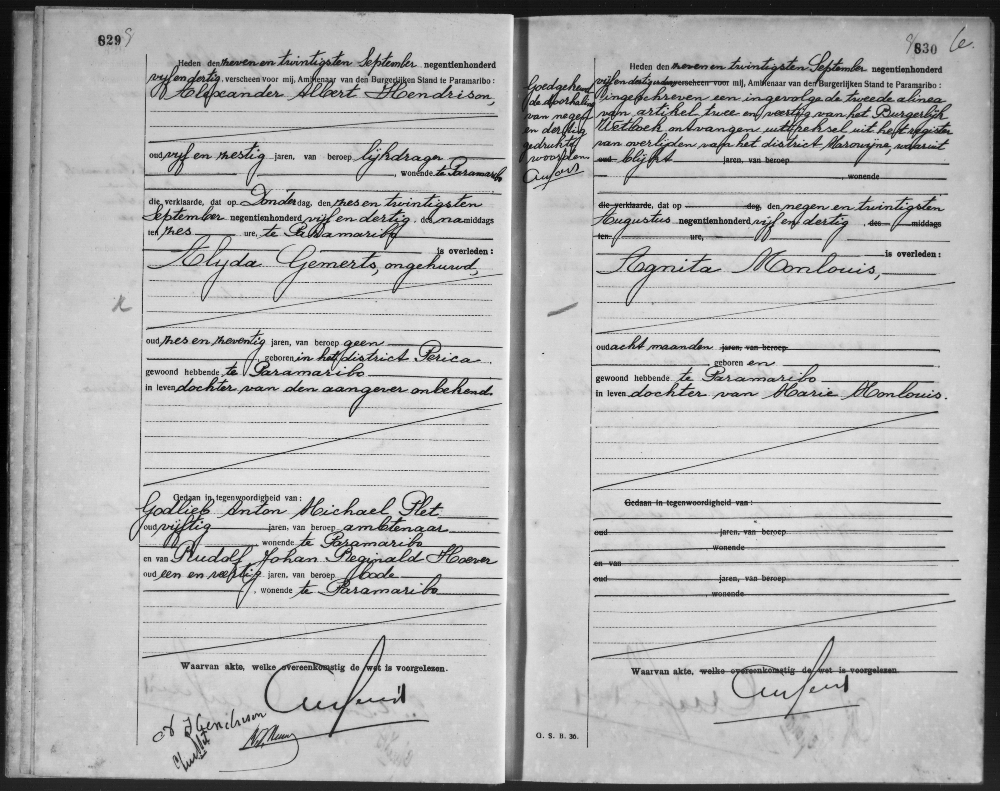

In [129]:
print(counter)
counter+=1
idx = next(file_idx)
print(idx)
print(os.path.join(groups[0][idx].split('_')[2],groups[0][idx]))
display(Image(os.path.join("G:\My Drive\Overlijdensdata Suriname",groups[0][idx].split('_')[2],groups[0][idx]), width=650))

### Check all anomalities
View a certificate, then decide if to move it to another folder

In [308]:
file_idx = iter(range(0,len(groups[-1])))

In [258]:
os.rename(os.path.join(groups[-1][idx].split('_')[2],groups[-1][idx]), os.path.join('one_empty', groups[-1][idx]))

In [302]:
os.rename(os.path.join(groups[-1][idx].split('_')[2],groups[-1][idx]), os.path.join('misc', groups[-1][idx]))

In [227]:
os.rename(os.path.join(groups[-1][idx].split('_')[2],groups[-1][idx]), os.path.join('vertical_marginalia', groups[-1][idx]))

In [305]:
os.rename(os.path.join(groups[-1][idx].split('_')[2],groups[-1][idx]), os.path.join('no_info', groups[-1][idx]))

0
1237\NL-HaNA_2.10.61_1237_0048.jpg


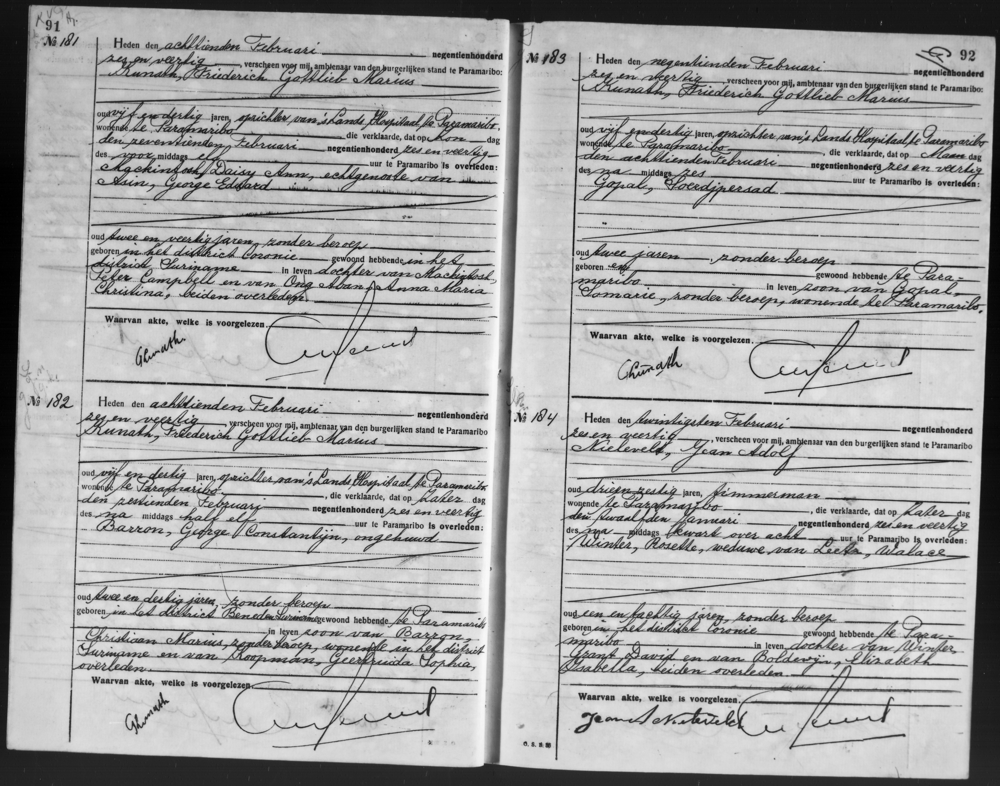

In [309]:
idx = next(file_idx)
print(idx)
print(os.path.join(groups[-1][idx].split('_')[2],groups[-1][idx]))
display(Image(os.path.join("G:\My Drive\Overlijdensdata Suriname",groups[-1][idx].split('_')[2],groups[-1][idx]), width=650))